In [1]:
import jax

jax.config.update("jax_platform_name", "cpu")
import numpyro

numpyro.set_host_device_count(4)

import sys

sys.path.append("..")
from pymc_experimental.statespace import structural as st
from pymc_experimental.statespace.utils.constants import SHORT_NAME_TO_LONG, MATRIX_NAMES
import matplotlib.pyplot as plt
import pymc as pm
import arviz as az
import pytensor
import pytensor.tensor as pt
import numpy as np
import pandas as pd
from patsy import dmatrix

plt.rcParams.update(
    {
        "figure.figsize": (14, 4),
        "figure.dpi": 144,
        "figure.constrained_layout.use": True,
        "axes.grid": True,
        "grid.linewidth": 0.5,
        "grid.linestyle": "--",
        "axes.spines.top": False,
        "axes.spines.bottom": False,
        "axes.spines.left": False,
        "axes.spines.right": False,
    }
)

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [ ]:
# Ignore warnings about Deprecated
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [58]:
import utils.globalsettings as gs

%load_ext autoreload
%autoreload 2

In [4]:
def unpack_statespace(ssm):
    """
    Unpacks the symbolic matrices from the statespace model.

    Args:
        ssm (dict): Dictionary containing the symbolic matrices.

    Returns:
        list: List of unpacked symbolic matrices.
    """
    return [ssm[SHORT_NAME_TO_LONG[x]] for x in MATRIX_NAMES]


def unpack_symbolic_matrices_with_params(mod, param_dict):
    """
    Unpacks the symbolic matrices from the statespace model with parameter values.

    Args:
        mod (type): The statespace model.
        param_dict (dict): Dictionary containing the parameter values.

    Returns:
        tuple: Tuple containing the unpacked symbolic matrices.
    """
    f_matrices = pytensor.function(
        list(mod._name_to_variable.values()), unpack_statespace(mod.ssm), on_unused_input="ignore"
    )
    x0, P0, c, d, T, Z, R, H, Q = f_matrices(**param_dict)
    return x0, P0, c, d, T, Z, R, H, Q


def simulate_from_numpy_model(mod, rng, param_dict, steps=100):
    """
    Helper function to simulate the components of a structural timeseries model outside of a PyMC model context.

    Args:
        mod (type): The structural timeseries model.
        rng (numpy.random.Generator): Random number generator.
        param_dict (dict): Dictionary containing the parameter values.
        steps (int, optional): Number of steps to simulate. Defaults to 100.

    Returns:
        tuple: Tuple containing the simulated components.
    """
    x0, P0, c, d, T, Z, R, H, Q = unpack_symbolic_matrices_with_params(mod, param_dict)
    Z_time_varies = Z.ndim == 3

    k_states = mod.k_states
    k_posdef = mod.k_posdef

    x = np.zeros((steps, k_states))
    y = np.zeros(steps)

    x[0] = x0
    if Z_time_varies:
        y[0] = Z[0] @ x0
    else:
        y[0] = Z @ x0

    if not np.allclose(H, 0):
        y[0] += rng.multivariate_normal(mean=np.zeros(1), cov=H)

    for t in range(1, steps):
        if k_posdef > 0:
            shock = rng.multivariate_normal(mean=np.zeros(k_posdef), cov=Q)
            innov = R @ shock
        else:
            innov = 0

        if not np.allclose(H, 0):
            error = rng.multivariate_normal(mean=np.zeros(1), cov=H)
        else:
            error = 0

        x[t] = c + T @ x[t - 1] + innov

        if Z_time_varies:
            y[t] = d + Z[t] @ x[t] + error
        else:
            y[t] = d + Z @ x[t] + error

    return x, y


def simulate_many_trajectories(mod, rng, param_dict, n_simulations, steps=100):
    """
    Simulates multiple trajectories of a structural timeseries model.

    Args:
        mod (type): The structural timeseries model.
        rng (numpy.random.Generator): Random number generator.
        param_dict (dict): Dictionary containing the parameter values.
        n_simulations (int): Number of simulations to perform.
        steps (int, optional): Number of steps to simulate. Defaults to 100.

    Returns:
        tuple: Tuple containing the simulated trajectories.
    """
    k_states = mod.k_states
    k_posdef = mod.k_posdef

    xs = np.zeros((n_simulations, steps, k_states))
    ys = np.zeros((n_simulations, steps))

    for i in range(n_simulations):
        x, y = simulate_from_numpy_model(mod, rng, param_dict, steps)
        xs[i] = x
        ys[i] = y
    return xs, ys

In [2]:
seed = sum(map(ord, "Structural Timeseries"))

rng = np.random.default_rng(seed)

# Introduction

This notebook is an introduction to the structural timeseries modeling framework introduced in `pymc_experimental.statespace`. 

The structural timeseries framework, described by Durbin and Koopsman (2010) in Chapter 3.6, is a way to decompose a univariate timeseries into component parts:

$$y_t = \mu_t + \gamma_t + c_t + \varepsilon_t$$

Where $\mu_t$ is a trend component, $\gamma_t$ is a seasonal component, $c_t$ is a cycle component, and $\varepsilon_t$ is a measurement error. Each of the components can themselves be constant or have stochastic innovations, rendering them time-varying.

The API for this class of model is modular, and allows you to mix-and-match components to make the time series of your dreams.

# Level and Trend Component

The most basic componet is the `LevelTrendComponent`, represented by $\mu_t$. This component allows for a time trend wit as many time derivatives as you like. To illustrate, we begin with a constant mean model.

`LevelTrendComponent` has two argumnets: `order` and `innovations_order`. `order` controls the number of non-zero time derivatives to include in the trend, while `innovations_order` is the number of components to have a stochastic innovation. To make a constant level, we include 1 derivative, and no innovations

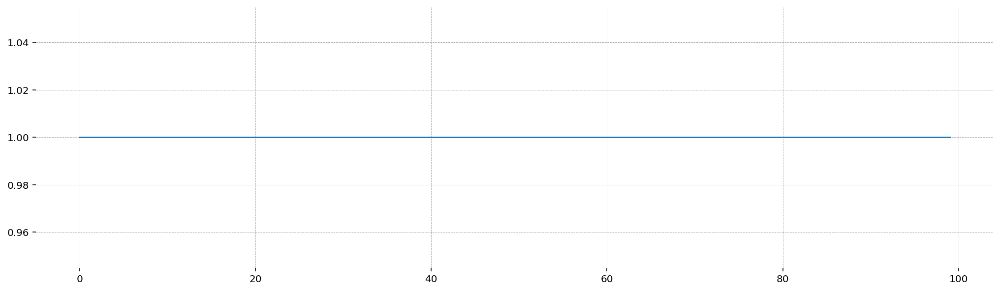

In [11]:
ll = st.LevelTrendComponent(order=1, innovations_order=0)
param_dict = {"initial_trend": np.array([1.0])}
plt.plot(simulate_from_numpy_model(ll, rng, param_dict=param_dict)[0][:, 0])

If we have 2 derivatives with no innovations, we get a deterministic trend model

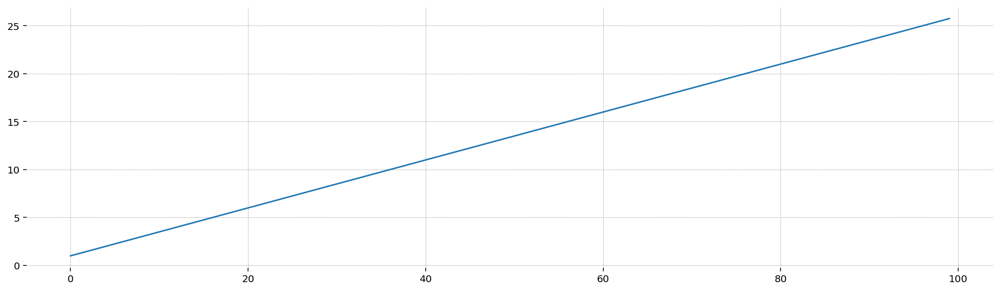

In [12]:
ll = st.LevelTrendComponent(order=2, innovations_order=0)
param_dict = {"initial_trend": np.array([1, 0.25])}
plt.plot(simulate_from_numpy_model(ll, rng, param_dict)[0][:, 0])

With 3 we can have a quadratic trend, and so on

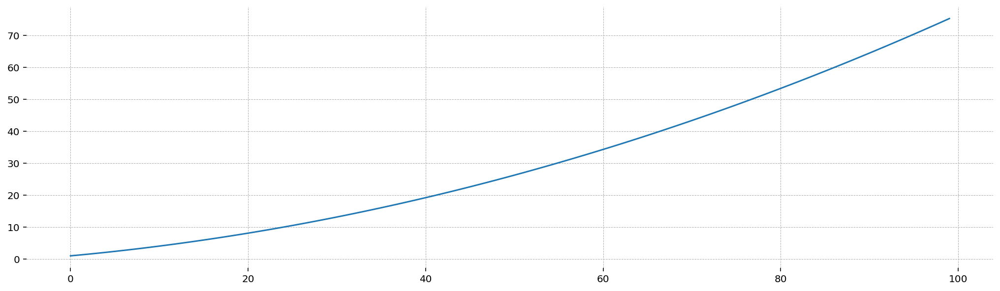

In [13]:
ll = st.LevelTrendComponent(order=3, innovations_order=0)
param_dict = {"initial_trend": np.array([1, 0.25, 0.01])}
plt.plot(simulate_from_numpy_model(ll, rng, param_dict)[0][:, 0])

To introduce time-varying elements into the model, we set the innovations order. 

* By default, the innovations order is equal to the order (all components of the trend are time-varying)
* If you pass an integer, all components beyond that integer will be static
* You can also pass a list of `1` for "include innovations at this order" and `0` for "exclude at this order"

A Gaussian Random Walk can be implemented using `order=1, innovations_order=1`

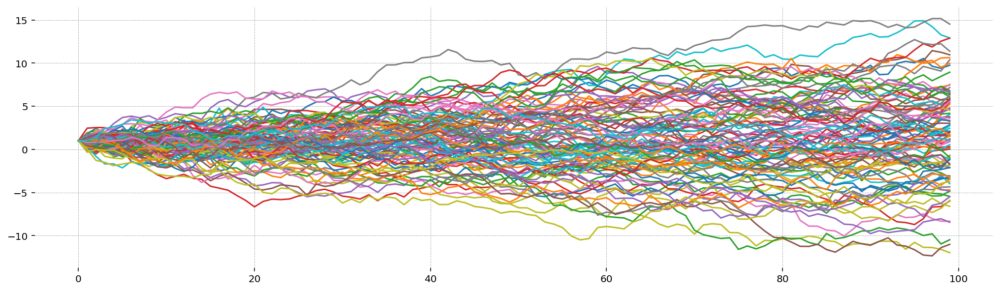

In [14]:
grw = st.LevelTrendComponent(order=1, innovations_order=1)
param_dict = {"initial_trend": np.ones((1,)), "sigma_trend": np.array([0.25])}

plt.plot(simulate_many_trajectories(grw, rng, param_dict, 100)[1].T);

A random walk with drift would have `order=2` but `innovations_order = 1`

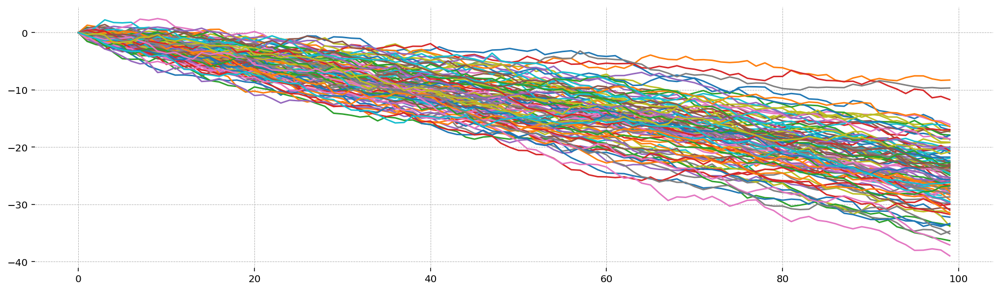

In [16]:
rwd = st.LevelTrendComponent(order=2, innovations_order=1)
param_dict = {"initial_trend": np.array([0, -0.25]), "sigma_trend": np.array([0.25])}

plt.plot(simulate_many_trajectories(rwd, rng, param_dict, 100)[1].T);

The local level model has `order=2` and `innovations_order = 2`. It corresponds to a Random walk with drift, where the drift also follows a random walk.

This is the first model where it's interesting to look at both hidden states and see their contributions to the final model. As promised, the trend component follows a random walk, while the level is a random walk with drift, with the drift at time $t$ equal to the trend at time $t-1$.

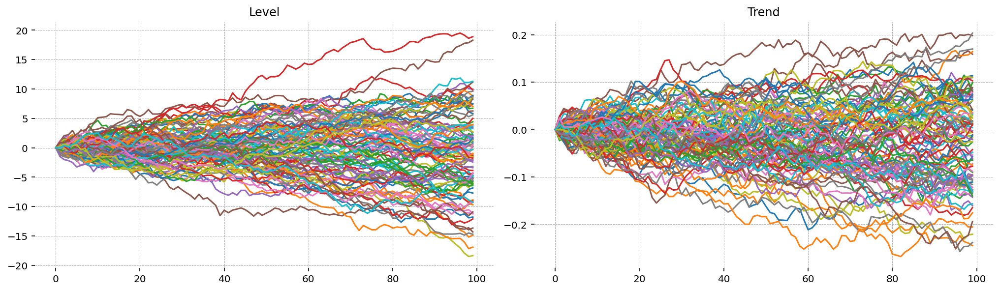

In [15]:
ll = st.LevelTrendComponent(order=2)
param_dict = {"initial_trend": np.zeros((2,)), "sigma_trend": np.array([0.25, 1e-4])}

fig, ax = plt.subplots(1, 2)
xs, ys = simulate_many_trajectories(ll, rng, param_dict, 100)
titles = ["Level", "Trend"]
for i, axis in enumerate(fig.axes):
    axis.plot(xs[:, :, i].T)
    axis.set_title(titles[i])
plt.show()

Durbin and Koopsman mention that many analysts find the level components produced by the local level model change too rapidly. In this case, they suggest to disable the innovations on the level, and have them only on the trend:

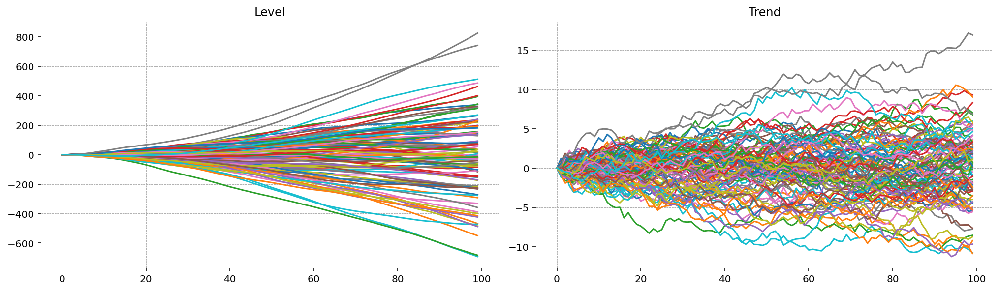

In [17]:
smooth_level = st.LevelTrendComponent(order=2, innovations_order=[0, 1])
param_dict = {"initial_trend": np.zeros((2,)), "sigma_trend": np.array([0.25])}

fig, ax = plt.subplots(1, 2)
xs, ys = simulate_many_trajectories(smooth_level, rng, param_dict, 100)
titles = ["Level", "Trend"]
for i, axis in enumerate(fig.axes):
    axis.plot(xs[:, :, i].T)
    axis.set_title(titles[i])
plt.show()

# Seasonal Components

Durbin and Koopsman present argue for two "cannonical" seasonal components: on in the time domain, and one in the frequency domain. Both are available in `statespace.structural`, as `TimeSeasonality` and `FreqSeasonal`, respectively.

## Time Domain Seasonality

Time domain seasonality is autoregressive. Seasonal effects are a repeating pattern over `season_length`, with the net effect summing to 0.

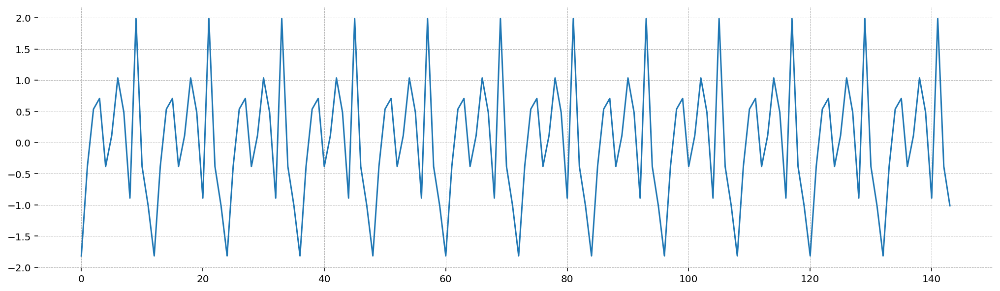

In [18]:
monthly_season = st.TimeSeasonality(name="annual_season", season_length=12, innovations=False)
param_dict = {"annual_season_coefs": rng.normal(size=11)}

x, y = simulate_from_numpy_model(monthly_season, rng, param_dict, steps=12 * 12)
plt.plot(y)

As promised, they sum to zero

In [19]:
np.allclose(y.reshape(-1, 12).sum(axis=1), 0)

True

When `innovations = True`, the seasonal components are time varying.

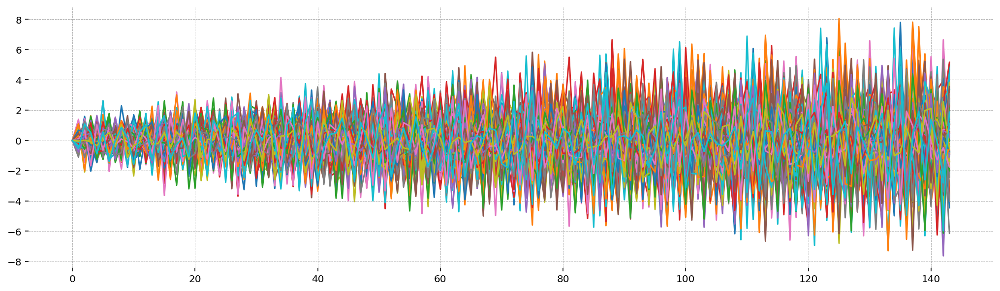

In [20]:
monthly_season = st.TimeSeasonality(name="annual_seasonal", season_length=12, innovations=True)
param_dict = {
    "annual_seasonal_coefs": np.zeros(
        11,
    ),
    "sigma_annual_seasonal": np.array([0.25]),
}

xs, ys = simulate_many_trajectories(
    monthly_season, rng, param_dict, n_simulations=100, steps=12 * 12
)
plt.plot(ys.T);

## Frequency Domain Seasonality

An alternative to using lagged terms is to use Fourier terms. In this case, the user can specify both the `seasonal_length` and the number of fourier terms to include. At `seasonal_length // 2` the representation is "saturated", so that's the highest you'll ever need to go (and that's what you get by default). Also important: at saturation, the last initial state is not identified. So if you request a saturated model, there will be one less initial parameter than you might expect.

Here are the six different frequencies we get for a monthly model. Since there are no innnovations, the strength of each frequency is entirely determined by the initial state. As we notes above, we only need to specify 11 initial states instead of 12, because the model is fully saturated.

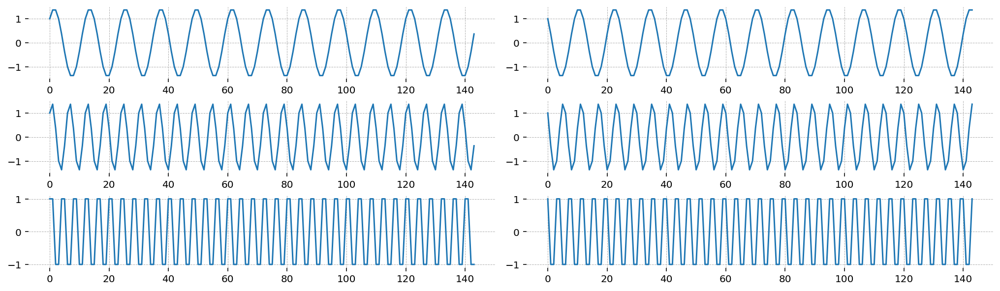

In [21]:
monthly_season = st.FrequencySeasonality(
    name="monthly_season", season_length=12, n=6, innovations=False
)
param_dict = {
    "monthly_season": np.ones(
        11,
    )
}
x, y = simulate_from_numpy_model(monthly_season, rng, param_dict, steps=12 * 12)
fig, ax = plt.subplots(3, 2)
for i, axis in enumerate(fig.axes):
    axis.plot(x[:, i])

Each frequency is comprised of one observed and one hidden component. The total seasonal pattern is the sum of the observed states (the even ones) 

In [22]:
monthly_season.ssm["design"].eval()

array([[1., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0.]])

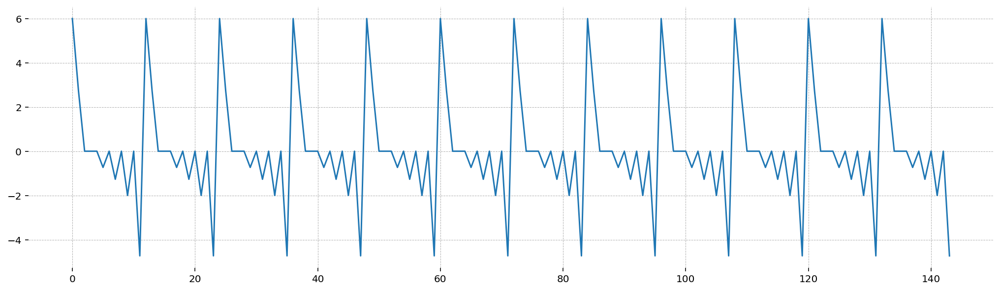

In [23]:
fig, ax = plt.subplots()
ax.plot(y);

When `innovations=True`, the states are time-varying

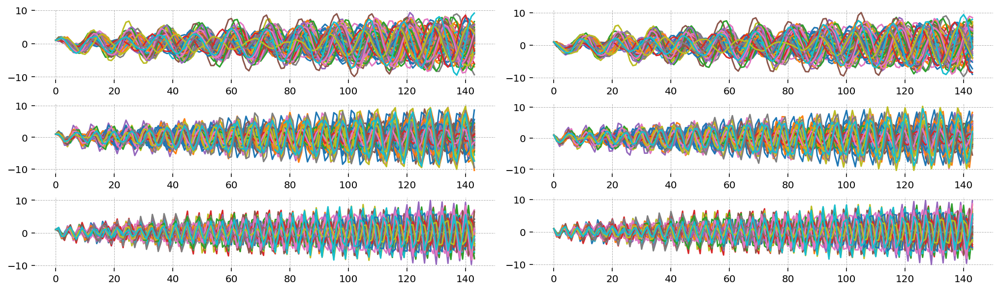

In [24]:
monthly_season = st.FrequencySeasonality(
    name="monthly_season", season_length=12, n=6, innovations=True
)
param_dict = {
    "monthly_season": np.ones(
        11,
    ),
    "sigma_monthly_season": np.array([0.07]),
}
xs, ys = simulate_many_trajectories(
    monthly_season, rng, param_dict, steps=12 * 12, n_simulations=100
)

fig, ax = plt.subplots(3, 2)
for i, axis in enumerate(fig.axes):
    axis.plot(xs[:, :, i].T)

## Autoregressive Component

The autoregressive component can be thought of as a way to introduce serially correlated errors into the model, rather than just white noise. The `order` argument governs how many lags to introduce. Like the `innovations_order` argumnet of the `LevelTrendComponent`, the `AutoregressiveComponent` can also take a list of 1's and 0's to specify which AR orders you would like included.

With no innovations, the AR component will look like an impulse response function

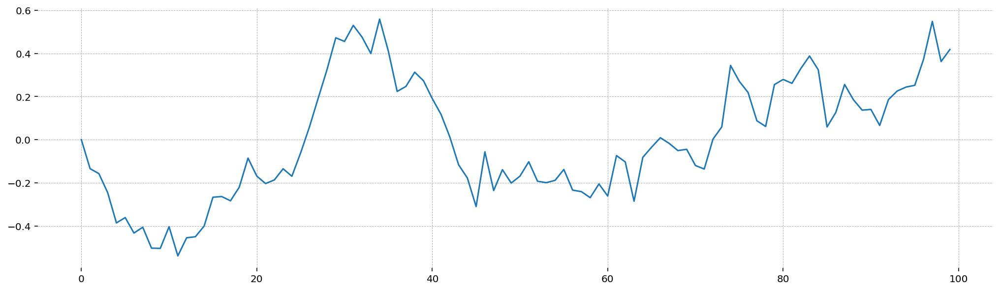

In [25]:
ar = st.AutoregressiveComponent(order=1)
param_dict = {"ar_params": np.array([0.95]), "sigma_ar": np.array([0.01])}
x, y = simulate_from_numpy_model(ar, rng, param_dict)
plt.plot(y)

One has to take care with the AR parameters, however. If they aren't stationary, the model won't be etiher. Ideally, non-stationary behavior should come from the level components, not the AR components. Actually, an AR(1) with `rho = 1` is just a Gaussian random walk!

If the parameter is bigger than one in absolutely value, you will get exponential blowup

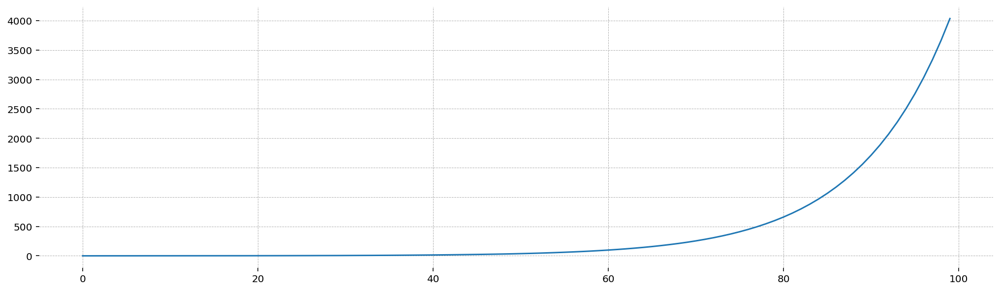

In [26]:
ar = st.AutoregressiveComponent(order=1)
param_dict = {"ar_params": np.array([1.1]), "sigma_ar": np.array([0.01])}
x, y = simulate_from_numpy_model(ar, rng, param_dict)
plt.plot(y)

Higher order AR processes are more difficult to keep stationary. Nevertheless, here's draws form an AR(3) with innovations

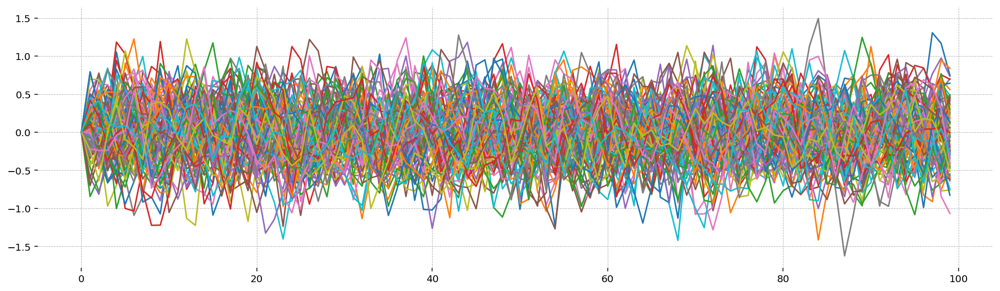

In [27]:
ar3 = st.AutoregressiveComponent(order=3)
param_dict = {"ar_params": np.array([0.7, -0.25, 0.03]), "sigma_ar": np.array([0.1])}
xs, ys = simulate_many_trajectories(ar3, rng, param_dict, 100)
plt.plot(ys.T);

## Cycle Component

A cycle is defined by (Cite Hyndman) as a long-term pattern of peaks and valleys with an unpredictable, changing duration. This module follows Durbin and Koopsman in taking a more narrow definition. Here, a cycle is simply:

 1. A long frequency seasonal component, lasting between 1.5 and 13 years, with;
 2. Only one fourier feature, so that it is modeled as pure sine wave, and;
 3. May include a dampening term, to induce stationarity in the presence of time-variation

Specifically, the trend component is defined as:

$$\begin{align} 
    \begin{bmatrix} c_{t+1} \\ c_{t+1}^\star \end{bmatrix} &= \rho_c \begin{bmatrix} \cos \lambda_c & \sin \lambda_c \\ -\sin \lambda_c & \cos \lambda_c \end{bmatrix} + \begin{bmatrix}\tilde \omega_t \\ \tilde \omega_t^\star \end{bmatrix}, & \begin{bmatrix} \omega_t \\ \tilde \omega_t^\star \end{bmatrix} &\sim N \left (0, \begin{bmatrix} \sigma_c^2 & 0 \\ 0 & \sigma_c^2 \end{bmatrix} \right ) \\
    c_t &= \begin{bmatrix} 1 & 0 \end{bmatrix} \begin{bmatrix} c_t \\ c_t^\star \end{bmatrix}
    \end{align}$$

Where $\rho_c$ is the dampening factor, and $\lambda_c$ is the period. Unlike the seasonal component, it is recommended to estimate $\lambda_c$, rather than setting it to a fixed value. Nevertheless, it is still possible to set it to a fixed value.

This first example sets the cycle to a fixed value. In this case it is identically equal to `FrequencySeasonal(s=13, n=1)`

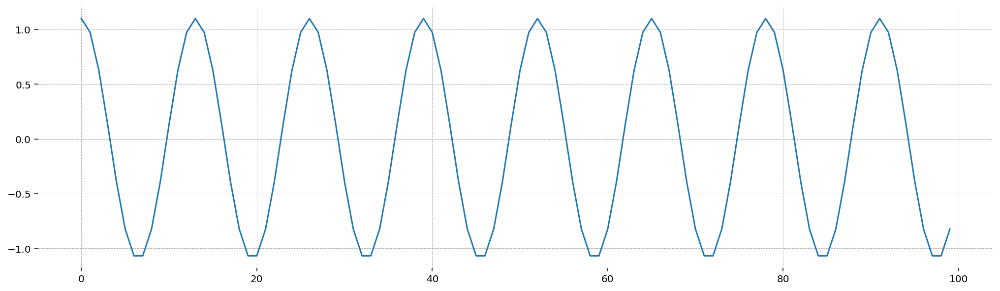

In [28]:
cycle = st.CycleComponent(name="cycle", cycle_length=13, innovations=False)
param_dict = {"cycle": np.array([1.1])}
x, y = simulate_from_numpy_model(cycle, rng, param_dict)
plt.plot(y)

Unique contributions come when we allow the period length to be estimated, and when a dampening term is present.

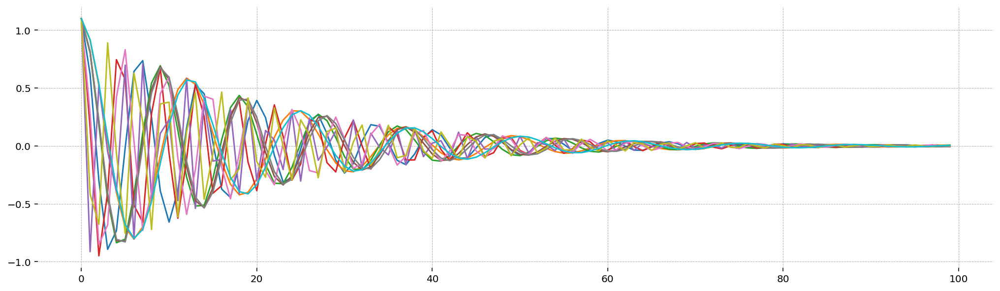

In [29]:
cycle = st.CycleComponent(name="cycle", estimate_cycle_length=True, innovations=False, dampen=True)
fig, ax = plt.subplots()
for _ in range(10):
    param_dict = {
        "cycle": np.array([1.1]),
        "cycle_cycle_length": rng.uniform(1.5, 13, size=(1,)),
        "cycle_dampening_factor": np.array([0.95]),
    }
    x, y = simulate_from_numpy_model(cycle, rng, param_dict)
    ax.plot(y)
plt.show()

When paired with hidden state innovations, this results in long-term stationary behavior. The dampening term prevents the cycle from growing larger and larger over time.  

You might argue that none of this looks particularly "cyclical", and you might be right. But this provides a tractable representation to an otherwise difficult component to capture.

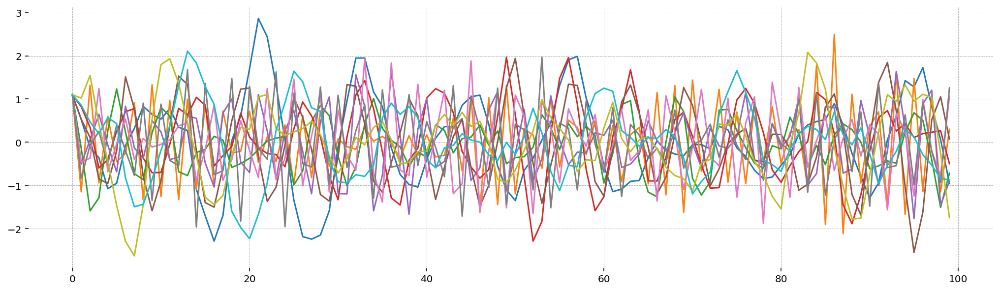

In [30]:
cycle = st.CycleComponent(name="cycle", estimate_cycle_length=True, innovations=True, dampen=True)
fig, ax = plt.subplots()
for _ in range(10):
    param_dict = {
        "cycle": np.array([1.1]),
        "cycle_cycle_length": rng.uniform(1.5, 13, size=(1,)),
        "cycle_dampening_factor": np.array([0.95]),
        "sigma_cycle": np.array([0.1]),
    }
    x, y = simulate_from_numpy_model(cycle, rng, param_dict)
    ax.plot(y)
plt.show()

## Exogenous Regression

One last component is the `RegressionComponent`. This allows you to introduce exogenous data into your structural model. The way this is done is a bit unusal: the regression coefficents are introduced as hidden states, and the exogenous data is appended to the design matrix. The state space matrices look like this:

$$
\begin{align}
T &= \begin{bmatrix} 1 & 0       & \dots & 0 \\
                    0       & 1 & \dots  & 0 \\
                    \vdots  & \vdots  & \ddots & 0 \\
                    0       &       0 & \dots  & 1
\end{bmatrix} 
& Z_t &= \begin{bmatrix} A_{t, 1} & A_{t, 2} & \dots & A_{t, 3} \end{bmatrix}
& X_0 &= \begin{bmatrix} \beta_1 \\ \beta_2 \\ \vdots \\ \beta_k \end{bmatrix}
\end{align}
$$

Where $A$ is a matrix of exogenous data. So $Z$ becomes time-varying, and contains the data. Suppose there are no state innovations, then:

$$
\begin{align}
    X_t &= T X_{t-1} \\
    y_t &= Z_t X_t \end{align}
$$

Since $T$ is the identity matrix, $X_0$ is a column vector of regression coeffecients, and $Z_t$ is the rows of the data, $y_t$ ends up as the regression $y_t = \sum_{i=0}^k \beta_i \cdot a_{t,i}$. This is completely equivalent to OLS, just computed recursively.

Here is an example of an only complicated OLS regression

In [31]:
def plot_exog_regression(x, y, data):
    """
    Plot the observed state, hidden states (data), and regression coefficients.

    Args:
        x (array-like): The regression coefficients.
        y (array-like): The observed state.
        data (array-like): The hidden states (data).
    """
    fig = plt.figure(figsize=(14, 6))
    gs = plt.GridSpec(nrows=2, ncols=2, figure=fig)

    y_axis = fig.add_subplot(gs[0, :])
    data_axis = fig.add_subplot(gs[1, 0])
    param_axis = fig.add_subplot(gs[1, 1])
    axes = [y_axis, data_axis, param_axis]
    datas = [y, data, x]
    titles = ["Observed State", "Hidden States (Data)", "Regression Coefficients"]
    for axis, data, title in zip(axes, datas, titles):
        axis.plot(data)
        axis.set_title(title)
    plt.show()

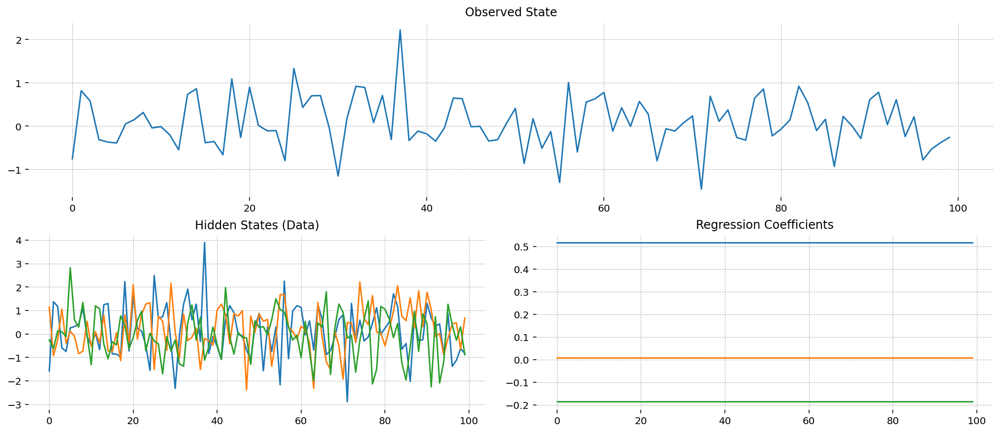

In [32]:
exog_data = rng.normal(size=(100, 3))
true_betas = rng.normal(size=(3,))
param_dict = {"beta_exog": true_betas, "data_exog": exog_data}
reg = st.RegressionComponent(name="exog", k_exog=3, innovations=False)
x, y = simulate_from_numpy_model(reg, rng, param_dict)

plot_exog_regression(x, y, exog_data)

As promised, every state in `y` is the regression `x0 @ data`

In [33]:
np.allclose(y, np.einsum("nk, k -> n", exog_data, true_betas))

True

Another way to use the `RegressionComponent` is with innovations. In this case, the regression coefficients will follow a random walk, $\beta_t = \beta_{t+1} + \varepsilon_t$, and the regression will be time-varying.

In the next example, a time-varying regression is combined with spines to make convincing cyclical patterns. All spines are initiall zero, and cycle-like behavior emerges as the different spline components become weaker/stronger over time.

c:\Users\mcondedesimon\OneDrive - Deloitte (O365D)\Documents\PLAYGROUND\tst_pymc\.venv\Lib\site-packages\patsy\util.py:672: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return _pandas_is_categorical_dtype(dt)


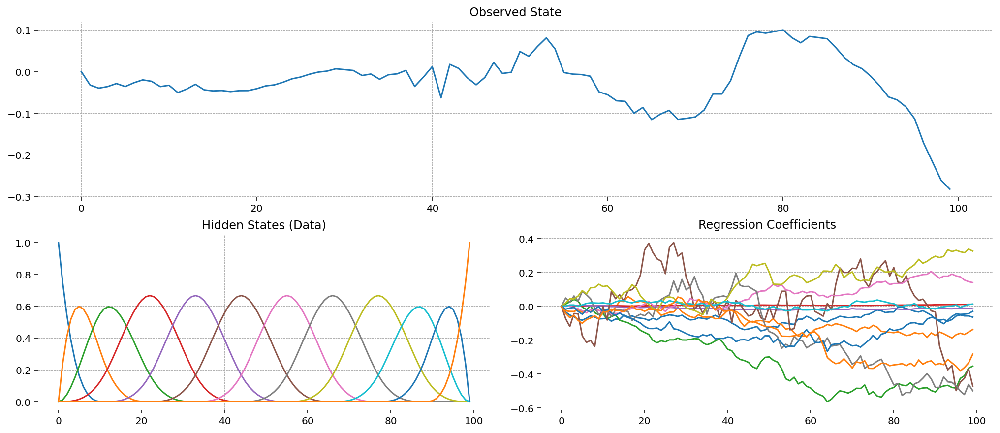

In [34]:
time = np.arange(100)
n_knots = 10
knot_points = np.quantile(time, np.linspace(0, 1, n_knots))[1:-1]

B = dmatrix(
    "bs(year, knots=knots, degree=3, include_intercept=True) - 1",
    {"year": time, "knots": knot_points},
)
reg = st.RegressionComponent(name="exog", k_exog=B.shape[1], innovations=True)

param_dict = {
    "beta_exog": np.zeros(reg.k_states),
    "data_exog": np.asarray(B),
    "sigma_beta_exog": rng.normal(scale=0.025, size=(reg.k_states)) ** 2,
}
x, y = simulate_from_numpy_model(reg, rng, param_dict)

plot_exog_regression(x, y, B)

# Combining components

More interesting models can be created by combining components. Components are combined by simple addition.

There is one special component, `MeasurementError`, that cannot be used on its own. It adds measurement error to the model.

Here is a local-linear trend model with monthly seasonality and measurement error:

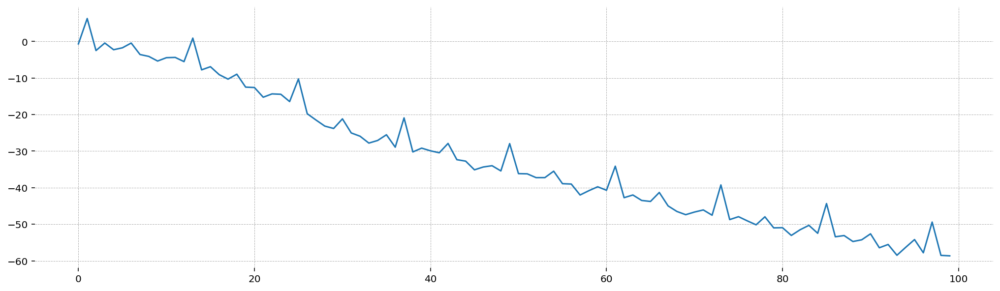

In [35]:
ll = st.LevelTrendComponent(order=2)
monthly_season = st.TimeSeasonality(name="monthly_seasonal", season_length=12, innovations=False)
measurement_error = st.MeasurementError(name="obs")

param_dict = {
    "initial_trend": np.zeros(
        2,
    ),
    "monthly_seasonal_coefs": rng.normal(size=11),
    "sigma_trend": np.array([0.25, 0.01]),
    "sigma_obs": np.array([0.1]),
}

mod = ll + monthly_season + measurement_error

x, y = simulate_from_numpy_model(mod, rng, param_dict)
plt.plot(y)

Nothing stops you from having many of the same component. This is especially relevant for seasonal components. Here is a model with both annual and monthly seasonality, in addition to the smooth trend

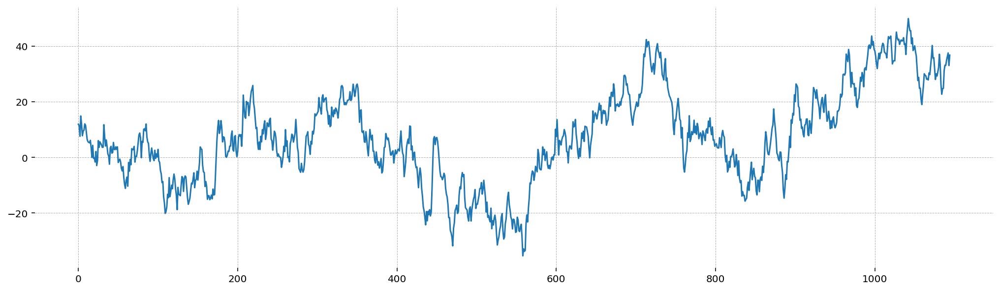

In [36]:
n_month = 1
n_year = 1

smooth_trend = st.LevelTrendComponent(order=2, innovations_order=[0, 1])
ar = st.AutoregressiveComponent(order=1)
monthly_season = st.FrequencySeasonality(
    name="monthly_seasonal", season_length=30, n=n_month, innovations=False
)
annual_season = st.FrequencySeasonality(
    name="annual_seasonal", season_length=365, n=n_year, innovations=False
)

param_dict = {
    "initial_trend": np.zeros(
        2,
    ),
    "sigma_trend": np.array([1e-5]),
    "monthly_seasonal": rng.normal(scale=20, size=n_month * 2),
    "annual_seasonal": rng.normal(scale=20, size=n_year * 2),
    "ar_params": np.array([0.95]),
    "sigma_ar": np.array([10]),
}


mod = smooth_trend + ar + monthly_season + annual_season
x, y = simulate_from_numpy_model(mod, rng, param_dict, steps=365 * 3)
plt.plot(y)

We can see the different components by looking at the model's hidden states

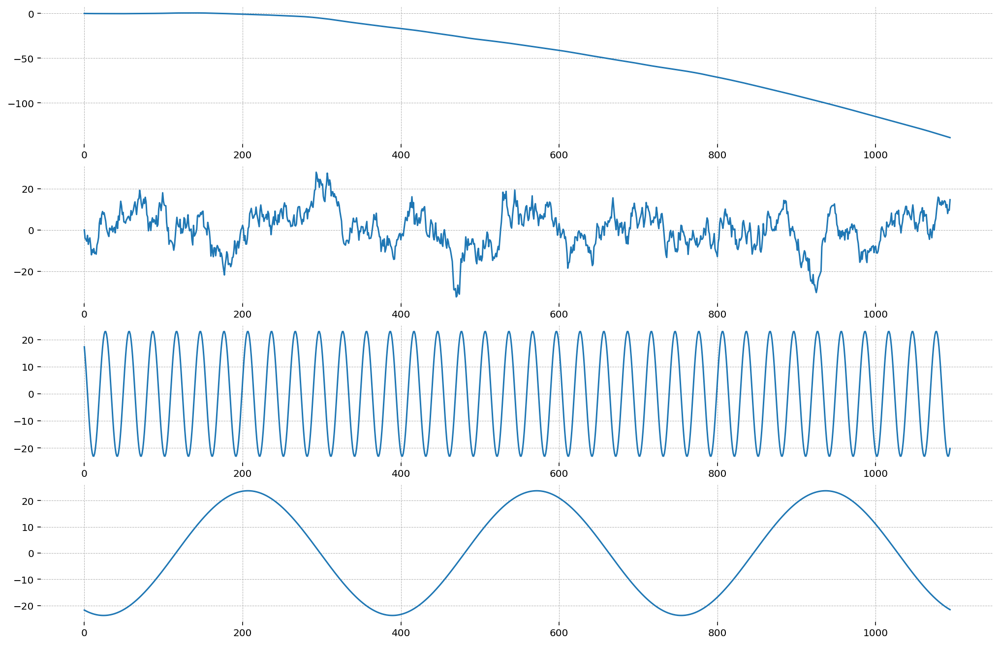

In [30]:
fig, ax = plt.subplots(4, figsize=(14, 9))
ax[0].plot(x[:, 0])
ax[1].plot(x[:, 2])
ax[2].plot(x[:, slice(3, 3 + n_month * 2, 2)].sum(axis=-1))
ax[3].plot(x[:, slice(-(n_year * 2), None, 2)].sum(axis=-1))
plt.show()

# PyMC Integration

Up until now I've been manually setting values in the statespace matrices, which is obviously not how this should be used. This has been for illustration purposes only.

What you should actually do is build a `PyMCStateSpace` model using the `.build()` method.

## Nile Data

Let's model the Nile river dataset with a smooth local level model with AR innovations and measurement error

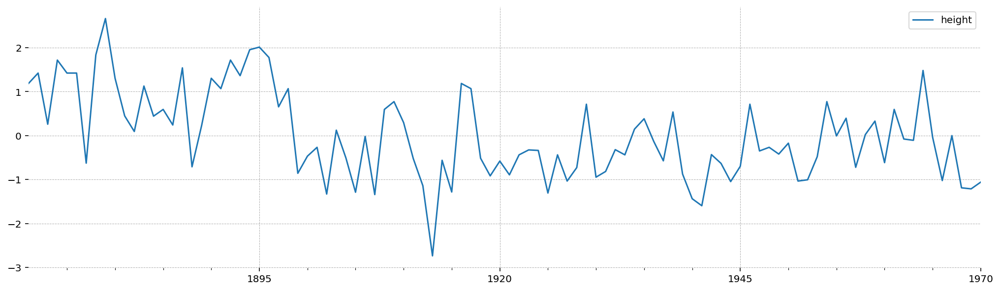

In [38]:
nile = pd.read_csv(
    gs.the_files.NILE, dtype={"x": "float64"}
)
nile.index = pd.date_range(start="1871-01-01", end="1970-01-01", freq="AS-Jan")
nile.rename(columns={"x": "height"}, inplace=True)
nile = (nile - nile.mean()) / nile.std()
nile.plot();

In [39]:
mod = st.LevelTrendComponent(order=2, innovations_order=[0, 1])
mod += st.AutoregressiveComponent(order=1)
mod += st.MeasurementError(name="obs")

ss_mod = mod.build(name="nile")

The following parameters should be assigned priors inside a PyMC model block: 
	initial_trend -- shape: (2,), constraints: None, dims: ('trend_state',)
	sigma_trend -- shape: (1,), constraints: Positive, dims: ('trend_shock',)
	ar_params -- shape: (1,), constraints: None, dims: (ar_lags, )
	sigma_ar -- shape: (1,), constraints: Positive, dims: None
	sigma_obs -- shape: (1,), constraints: Positive, dims: None
	P0 -- shape: (3, 3), constraints: Positive semi-definite, dims: ('state', 'state_aux')


In [40]:
ss_mod.param_dims

{'initial_trend': ('trend_state',),
 'sigma_trend': ('trend_shock',),
 'ar_params': ('ar_lags',),
 'sigma_obs': ('observed_state',),
 'P0': ('state', 'state_aux')}

In [41]:
initial_trend_dims, sigma_trend_dims, ar_dims, sigma_obs_dims, P0_dims = ss_mod.param_dims.values()
coords = ss_mod.coords

with pm.Model(coords=coords) as model_1:
    P0_diag = pm.Gamma("P0_diag", alpha=2, beta=5, dims=P0_dims[0])
    P0 = pm.Deterministic("P0", pt.diag(P0_diag), dims=P0_dims)
    initial_trend = pm.Normal("initial_trend", dims=initial_trend_dims)
    ar_params = pm.Beta("ar_params", alpha=1, beta=1, dims=ar_dims)

    sigma_trend = pm.Gamma("sigma_trend", alpha=2, beta=10, dims=sigma_trend_dims)
    sigma_obs = pm.Gamma("sigma_obs", alpha=2, beta=5, dims=["observed_state"])
    sigma_ar = pm.Gamma("sigma_ar", alpha=2, beta=10)

    ss_mod.build_statespace_graph(nile, mode="JAX")
    idata = pm.sample(nuts_sampler="numpyro", target_accept=0.9)

Compiling...
Compilation time = 0:00:50.810809
Sampling...


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Sampling time = 0:00:38.796585
Transforming variables...
Transformation time = 0:00:28.826229


c:\Users\mcondedesimon\OneDrive - Deloitte (O365D)\Documents\PLAYGROUND\tst_pymc\.venv\Lib\site-packages\arviz\stats\density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")


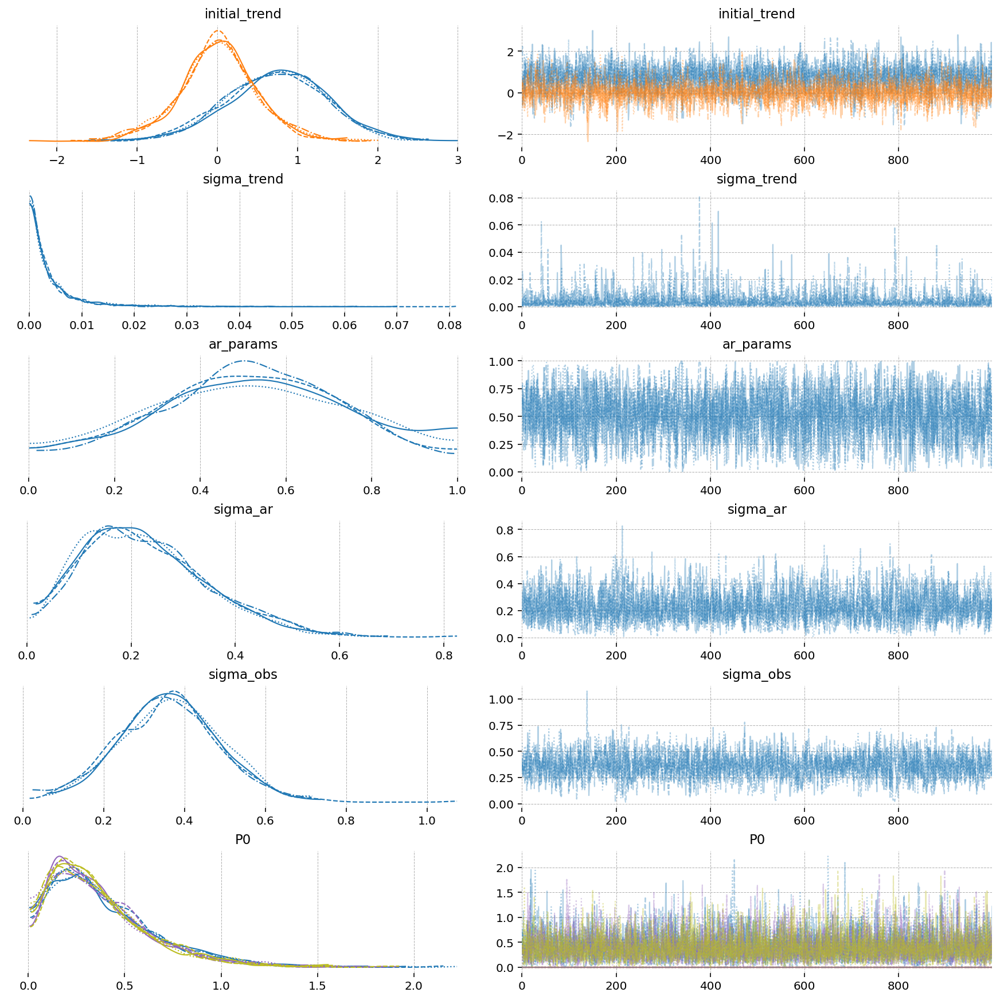

In [42]:
az.plot_trace(idata, var_names=ss_mod.param_names);

In [43]:
post_pred = ss_mod.sample_conditional_posterior(idata)

c:\Users\mcondedesimon\OneDrive - Deloitte (O365D)\Documents\PLAYGROUND\tst_pymc\.venv\Lib\site-packages\pytensor\link\jax\linker.py:28: UserWarning: The RandomType SharedVariables [RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC7E7182E0>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC7E71A6C0>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC7E718820>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC7E719D20>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC7E718AC0>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC7E71BCA0>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


We can look at smoother outputs since there is measurement noise. If there is no measurement noise, the smoother and filter will noiselessly encode the data, so only the outputs from the one-step ahead predictions are interesting.

We can start by looking at the different estimated components. There is a helper method, `extract_components_from_idata`, to grab them out of the `idata` returned by post-estimation sampling functions, such as `sample_conditional_posterior`.

In [44]:
component_idata = ss_mod.extract_components_from_idata(post_pred)
component_hdi = az.hdi(component_idata)

Variables filtered_posterior_observed, smoothed_posterior_observed, predicted_posterior_observed do not contain all hidden states (their last dimension is not 3). They will not be present in the modified idata.


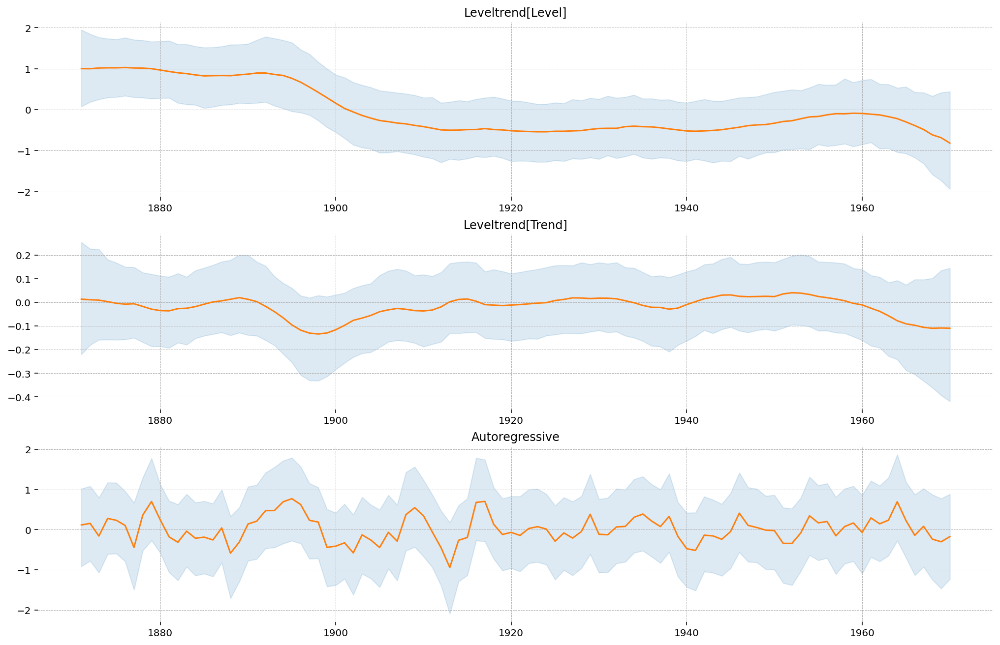

In [45]:
fig, ax = plt.subplots(3, 1, figsize=(14, 9))

for axis, state in zip(fig.axes, component_idata.coords["state"].values):
    axis.plot(
        nile.index,
        component_idata.stack(sample=["chain", "draw"])
        .smoothed_posterior.sel(state=state)
        .mean(dim="sample"),
        color="tab:orange",
    )
    axis.fill_between(
        nile.index,
        *component_hdi.smoothed_posterior.sel(state=state).values.T,
        color="tab:blue",
        alpha=0.15
    )
    axis.set_title(state.title())

All structural models in the statespace package are additive. To get the "final product", just add together the components.

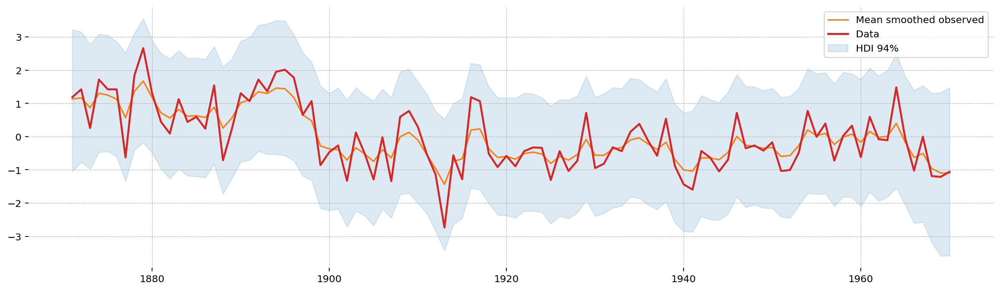

In [46]:
fig, ax = plt.subplots()
hdi = az.hdi(component_idata)
ax.plot(
    nile.index,
    (
        component_idata.stack(sample=["chain", "draw"])
        .smoothed_posterior.sum(dim="state")
        .mean(dim="sample")
    ),
    color="tab:orange",
    label="Mean smoothed observed",
)
ax.plot(nile.index, nile.values, color="tab:red", lw=2, label="Data")
ax.fill_between(
    nile.index,
    *hdi.smoothed_posterior.sum(dim="state").values.T,
    color="tab:blue",
    alpha=0.15,
    label="HDI 94%"
)
ax.legend()
plt.show()

Forcasts are also possible. There is evidently a lot of tail mass in the trend innnovations, because they fan out very quickly. That would be something to look into for improving the model.

In [47]:
nile_forecast = ss_mod.forecast(idata, start=nile.index[-1], periods=10)
nile_forecast = nile_forecast.stack(sample=["chain", "draw"])

c:\Users\mcondedesimon\OneDrive - Deloitte (O365D)\Documents\PLAYGROUND\tst_pymc\.venv\Lib\site-packages\pytensor\link\jax\linker.py:28: UserWarning: The RandomType SharedVariables [RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC70DDDE00>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [forecast_combined]


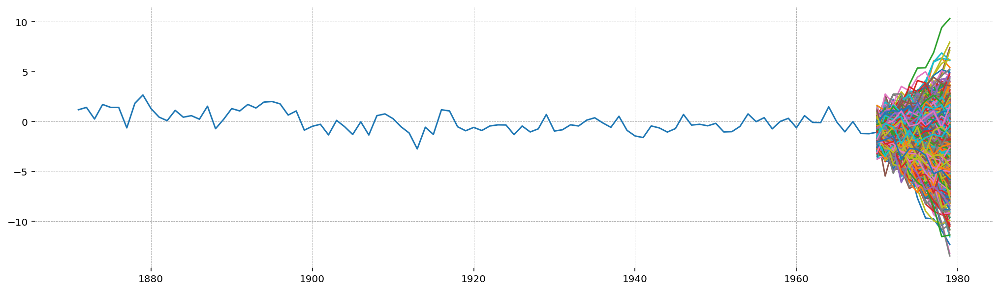

In [48]:
fig, ax = plt.subplots()
ax.plot(nile.index, nile.values)
ax.plot(nile_forecast.coords["time"], nile_forecast.forecast_observed.values.squeeze())
plt.show()

## Airline Data

Another famous timeseries dataset is the airline dataset. It has both a non-stationary trend and a seasonal component. We can model it with a local level and a seasonal trend. The seasonal trend will be time-varying, because it appears ot be increasing in strength

I leave away the measurement error just to emphasize that it's not necessary to have

In [59]:
import utils.globalsettings as gs

gs.the_files.__dict__

{'NILE': 'c:\\Users\\mcondedesimon\\OneDrive - Deloitte (O365D)\\Documents\\PLAYGROUND\\tst_pymc\\PYTHON\\utils\\..\\..\\data\\test\\nile.csv',
 'CFG_FILE': 'c:\\Users\\mcondedesimon\\OneDrive - Deloitte (O365D)\\Documents\\PLAYGROUND\\tst_pymc\\PYTHON\\utils\\..\\..\\config.ini'}

<Axes: xlabel='index'>

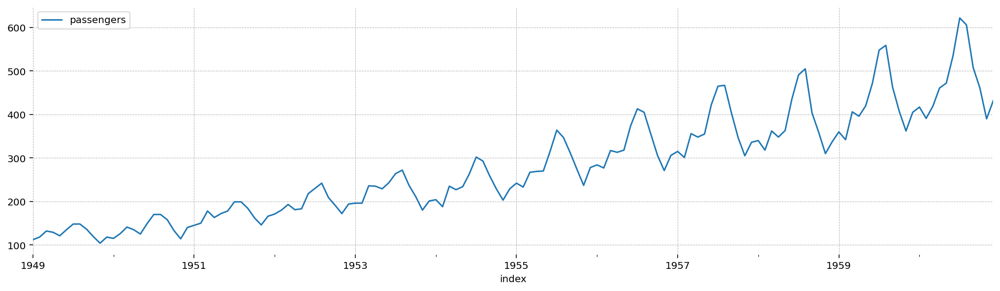

In [60]:
airpass = pd.read_csv(
    gs.the_files.AIR,
    parse_dates=True,
    date_format="%Y %b",
    index_col=0,
    dtype={"value": float},
).rename(columns={"value": "passengers"})
airpass.index.freq = airpass.index.inferred_freq
airpass.plot()

In [61]:
ll = st.LevelTrendComponent(order=2)
se = st.FrequencySeasonality(season_length=12, name="annual")

mod = ll + se
ss_mod = mod.build()

The following parameters should be assigned priors inside a PyMC model block: 
	initial_trend -- shape: (2,), constraints: None, dims: ('trend_state',)
	sigma_trend -- shape: (2,), constraints: Positive, dims: ('trend_shock',)
	annual -- shape: (11,), constraints: None, dims: (annual_initial_state, )
	sigma_annual -- shape: (1,), constraints: Positive, dims: None
	P0 -- shape: (14, 14), constraints: Positive semi-definite, dims: ('state', 'state_aux')


In [62]:
ss_mod.param_dims

{'initial_trend': ('trend_state',),
 'sigma_trend': ('trend_shock',),
 'annual': ('annual_initial_state',),
 'P0': ('state', 'state_aux')}

In [63]:
initial_trend_dims, sigma_trend_dims, annual_dims, P0_dims = ss_mod.param_dims.values()
coords = ss_mod.coords

In [64]:
with pm.Model(coords=coords) as model_2:
    P0_diag = pm.Gamma("P0_diag", alpha=2, beta=1, dims=P0_dims[0])
    P0 = pm.Deterministic("P0", pt.diag(P0_diag), dims=P0_dims)
    initial_trend = pm.Normal("initial_trend", sigma=[100, 1], dims=initial_trend_dims)
    annual_seasonal = pm.Normal("annual", sigma=100, dims=annual_dims)

    sigma_trend = pm.Gamma("sigma_trend", alpha=2, beta=1, dims=sigma_trend_dims)
    sigma_monthly_season = pm.Gamma("sigma_annual", alpha=2, beta=1)
    sigma_ar = pm.Gamma("sigma_ar", alpha=2, beta=1)

    ss_mod.build_statespace_graph(airpass, mode="JAX")
    idata = pm.sample(nuts_sampler="numpyro")

Compiling...
Compilation time = 0:00:42.029306
Sampling...


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Sampling time = 0:10:02.515154
Transforming variables...
Transformation time = 0:01:47.025269


c:\Users\mcondedesimon\OneDrive - Deloitte (O365D)\Documents\PLAYGROUND\tst_pymc\.venv\Lib\site-packages\arviz\stats\density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")


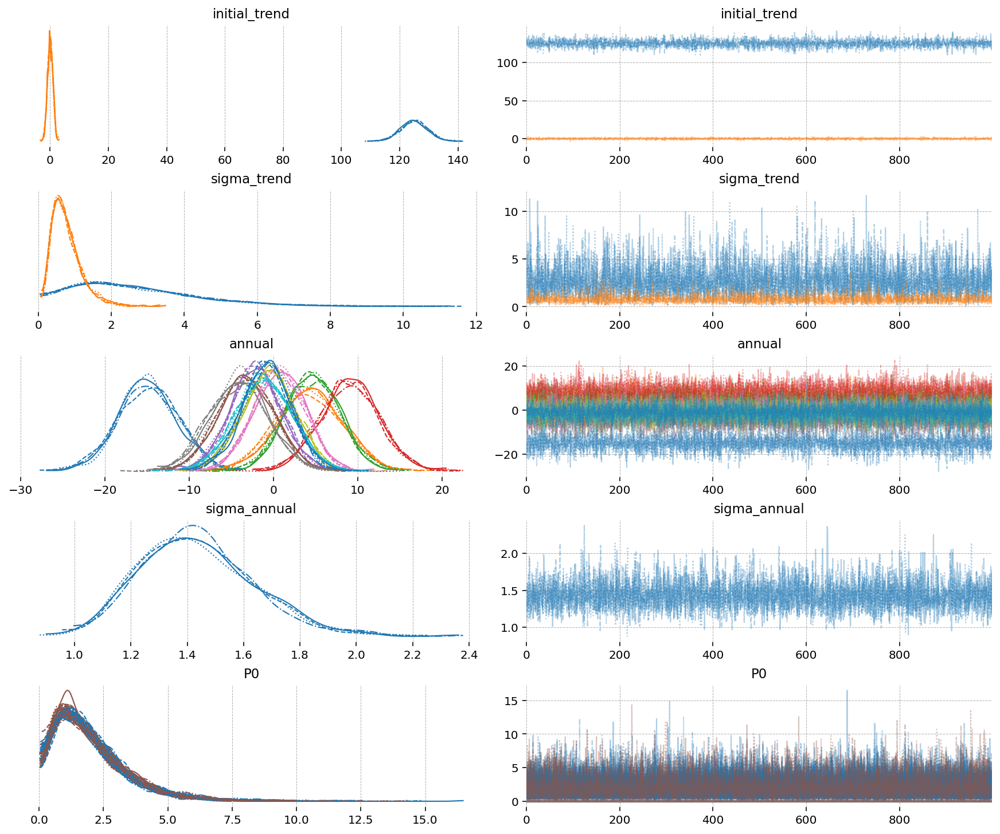

In [65]:
az.plot_trace(idata, var_names=ss_mod.param_names);

In [66]:
post = ss_mod.sample_conditional_posterior(idata)

c:\Users\mcondedesimon\OneDrive - Deloitte (O365D)\Documents\PLAYGROUND\tst_pymc\.venv\Lib\site-packages\pytensor\link\jax\linker.py:28: UserWarning: The RandomType SharedVariables [RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC1C7ED380>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC1C2F10E0>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC1D5F7A00>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC1C905700>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC1C7EEA40>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC1C908580>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


As before, we compress the raw outputs to the component "states" using `extract_components_from_idata`

In [67]:
component_idata = ss_mod.extract_components_from_idata(post)
component_states = component_idata.coords["state"].values.tolist()
component_states

Variables filtered_posterior_observed, smoothed_posterior_observed, predicted_posterior_observed do not contain all hidden states (their last dimension is not 14). They will not be present in the modified idata.


['LevelTrend[level]', 'LevelTrend[trend]', 'annual']

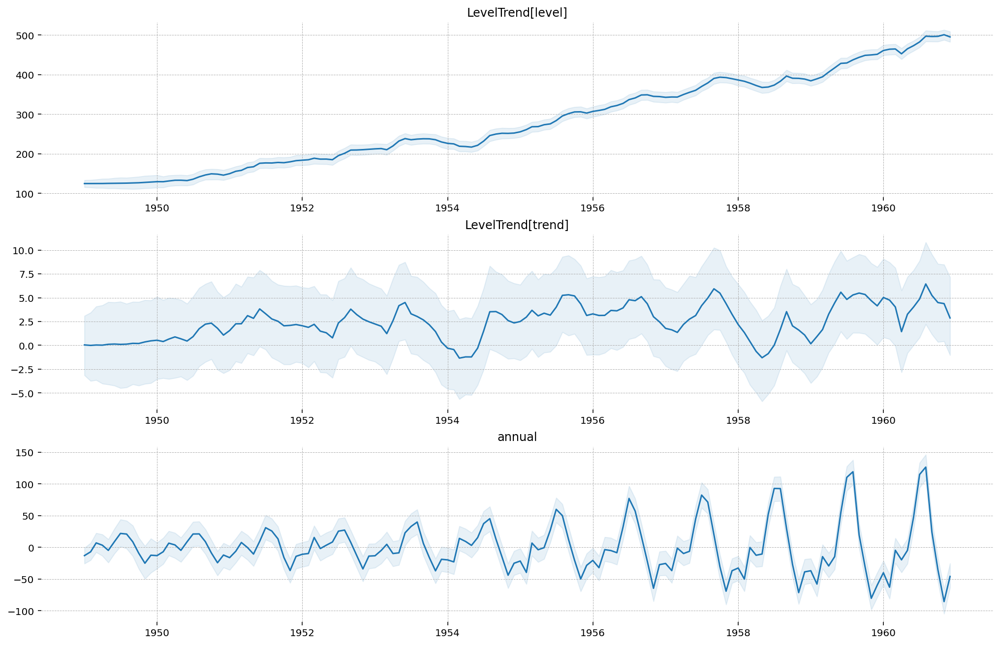

In [68]:
fig, ax = plt.subplots(3, 1, figsize=(14, 9))
x_values = component_idata.coords["time"]
for axis, name in zip(fig.axes, component_states):
    data = component_idata.predicted_posterior.sel(state=name)
    hdi = az.hdi(data).predicted_posterior
    mean = data.mean(dim=["chain", "draw"])

    axis.plot(x_values, mean)
    axis.fill_between(x_values, *hdi.values.T, color="tab:blue", alpha=0.1)
    axis.set_title(name)
plt.show()

And as before, taking the sum gives the predicted data 

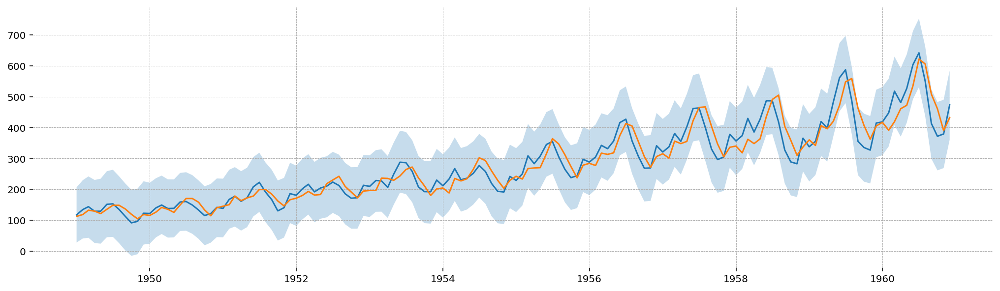

In [69]:
fig, ax = plt.subplots()
post_stacked = post.stack(sample=["chain", "draw"])
x_values = post_stacked.coords["time"]
hdi_post = az.hdi(post)
post_stacked = post.stack(sample=["chain", "draw"])

ax.plot(
    x_values,
    post_stacked.predicted_posterior.sum(dim="state").mean(dim="sample"),
)
ax.fill_between(x_values, *hdi_post.predicted_posterior.sum(dim="state").values.T, alpha=0.25)
ax.plot(airpass.index, airpass.values)

In [70]:
forecasts = ss_mod.forecast(idata, start=airpass.index[-1], periods=24)
forecasts = forecasts.stack(sample=["chain", "draw"])

c:\Users\mcondedesimon\OneDrive - Deloitte (O365D)\Documents\PLAYGROUND\tst_pymc\.venv\Lib\site-packages\pytensor\link\jax\linker.py:28: UserWarning: The RandomType SharedVariables [RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC76EACF20>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [forecast_combined]


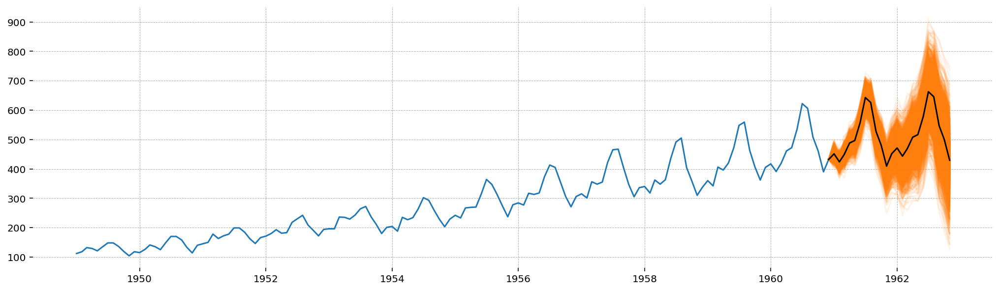

In [71]:
fig, ax = plt.subplots()
ax.plot(airpass.index, airpass)
ax.plot(
    forecasts.coords["time"],
    forecasts.forecast_observed.values.squeeze(),
    color="tab:orange",
    alpha=0.1,
)
ax.plot(
    forecasts.coords["time"],
    forecasts.forecast_observed.mean(dim="sample").values.squeeze(),
    color="k",
    alpha=1,
)

plt.show()

## Cherry Blossom Data

One last famous dataset is the Cherry Blossom data. A spline regression fit to this dataset is used on the cover of Richard McElreath's Statistical Rethinking. In the spirit of that cover, we can fit a time-varying spline regression with a smooth trend to the dataset. We can also include serial-correlated errors using an AutoRegressive component. 

In [72]:
blossom_data = pd.read_csv(pm.get_data("cherry_blossoms.csv"), sep=";")
blossom_data.year = pd.date_range(start="01-01-801", periods=1215, freq="Ys", unit="s")
blossom_data.set_index("year", inplace=True)
blossom_data.index.freq = blossom_data.index.inferred_freq

# Take the last 300 datapoints, otherwise the model doesn't fit into the memory of my poor laptop
blossom_data = blossom_data.doy.iloc[-300:]

<Axes: xlabel='year'>

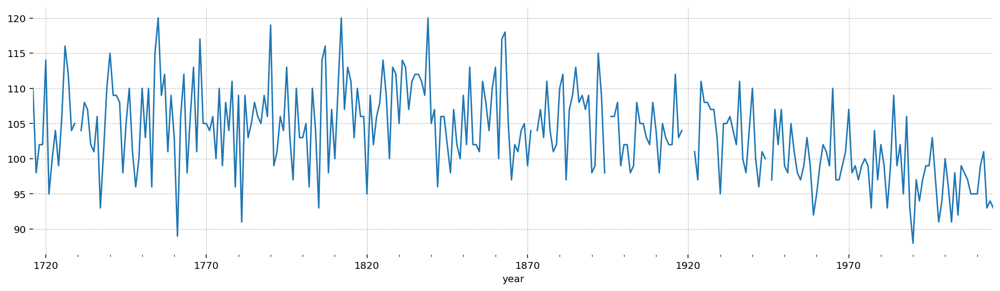

In [73]:
blossom_data.plot()

In [74]:
num_knots = 15
spline_knots = np.quantile(blossom_data.index.year, np.linspace(0, 1, num_knots))[1:-1]
B = dmatrix(
    "bs(year, knots=knots, degree=3, include_intercept=True) - 1",
    {"year": blossom_data.index.year, "knots": spline_knots},
)

c:\Users\mcondedesimon\OneDrive - Deloitte (O365D)\Documents\PLAYGROUND\tst_pymc\.venv\Lib\site-packages\patsy\util.py:672: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return _pandas_is_categorical_dtype(dt)


In [75]:
ll = st.LevelTrendComponent(order=2, innovations_order=[0, 1])
spline_reg = st.RegressionComponent(name="spline", k_exog=B.shape[1], innovations=False)
ar_error = st.AutoregressiveComponent(order=1)
mod = (ll + spline_reg + ar_error).build()

The following parameters should be assigned priors inside a PyMC model block: 
	initial_trend -- shape: (2,), constraints: None, dims: ('trend_state',)
	sigma_trend -- shape: (1,), constraints: Positive, dims: ('trend_shock',)
	beta_spline -- shape: (1,), constraints: None, dims: ('exog_state',)
	data_spline -- shape: (None, 17), constraints: None, dims: ('time', 'exog_state')
	ar_params -- shape: (1,), constraints: None, dims: (ar_lags, )
	sigma_ar -- shape: (1,), constraints: Positive, dims: None
	P0 -- shape: (20, 20), constraints: Positive semi-definite, dims: ('state', 'state_aux')


In [76]:
with pm.Model(coords=mod.coords) as blossom_mod:
    P0_sigma = pm.Gamma("P0_diag", alpha=2, beta=5)
    P0 = pm.Deterministic("P0", pt.eye(mod.k_states) * P0_sigma, dims=["state", "state_aux"])

    data_spline = pm.MutableData("data_spline", np.asarray(B))

    initial_trend = pm.Normal("initial_trend", sigma=[30, 1], dims=["trend_state"])

    beta_spline = pm.Laplace("beta_spline", mu=0, b=3, dims=["exog_state"])
    ar_params = pm.Beta("ar_params", alpha=1, beta=1, dims=["ar_lags"])

    sigma_trend = pm.Exponential("sigma_trend", 1, dims=["trend_shock"])
    sigma_ar = pm.Exponential("sigma_ar", 1)

    mod.build_statespace_graph(blossom_data, mode="JAX")

    idata = pm.sample(nuts_sampler="numpyro", target_accept=0.95)

c:\Users\mcondedesimon\OneDrive - Deloitte (O365D)\Documents\PLAYGROUND\tst_pymc\.venv\Lib\site-packages\pymc_experimental\statespace\utils\data_tools.py:142: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
Compiling...
Compilation time = 0:00:54.232586
Sampling...


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Sampling time = 3:47:16.666816
Transforming variables...
Transformation time = 0:09:42.163837


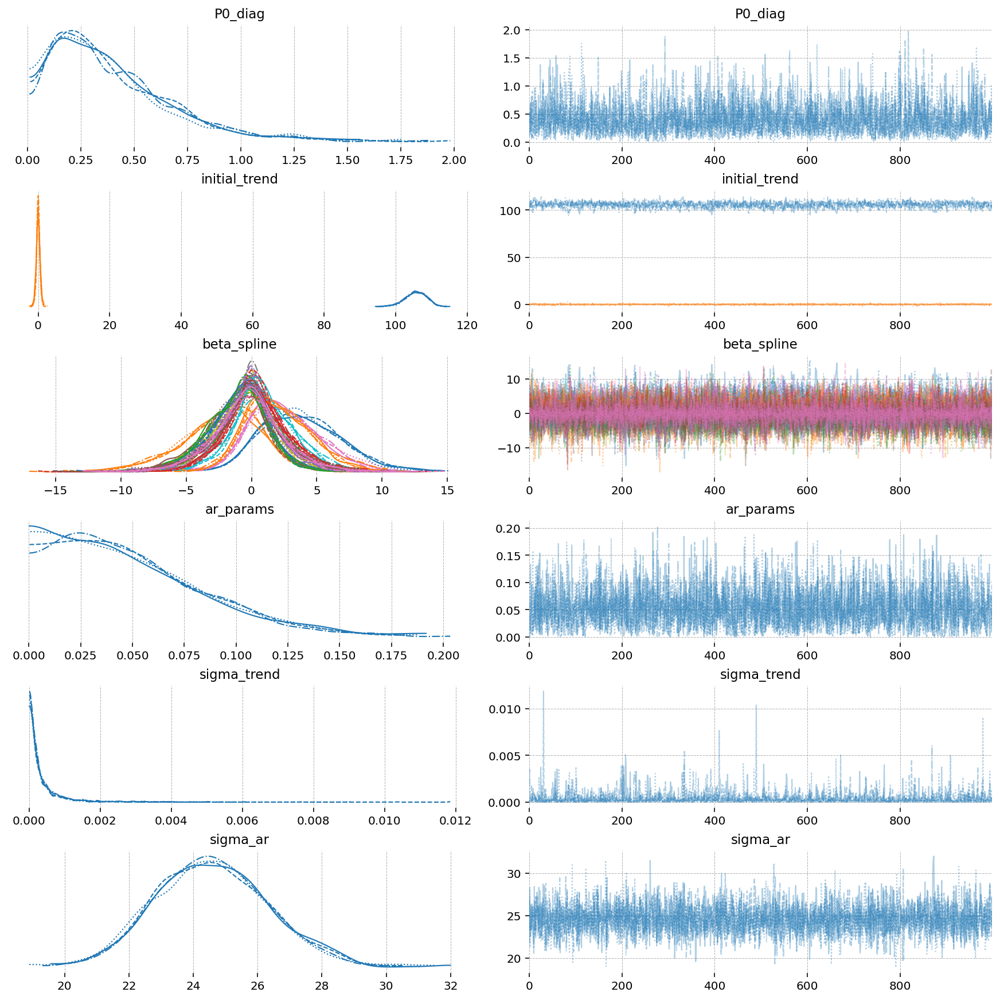

In [77]:
plot_vars = ["P0_diag", "initial_trend", "beta_spline", "ar_params", "sigma_trend", "sigma_ar"]
az.plot_trace(idata, var_names=plot_vars);

In [78]:
post = mod.sample_conditional_posterior(idata)

c:\Users\mcondedesimon\OneDrive - Deloitte (O365D)\Documents\PLAYGROUND\tst_pymc\.venv\Lib\site-packages\pytensor\link\jax\linker.py:28: UserWarning: The RandomType SharedVariables [RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC72F52A40>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC1B743760>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC72F50040>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC72F504A0>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC72F51EE0>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x1CC72F512A0>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


In [79]:
hdi_post = az.hdi(post)

<Axes: title={'center': "observed_state = ['data']"}, xlabel='year', ylabel='predicted_posterior_observed'>

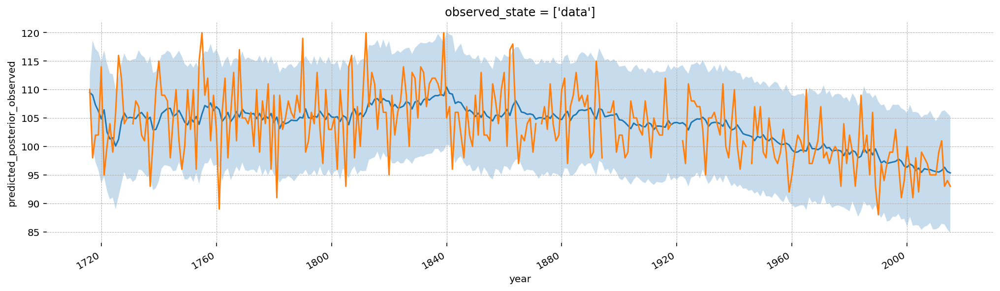

In [80]:
fig, ax = plt.subplots()
post.predicted_posterior_observed.mean(dim=["chain", "draw"]).plot.line(
    x="time", ax=ax, add_legend=False
)
ax.fill_between(
    blossom_data.index,
    *hdi_post.predicted_posterior_observed.isel(observed_state=0).values.T,
    alpha=0.25
)
blossom_data.plot(ax=ax)